# Визуализация работы нейросетей на картинках с уменьшенным разрешением

## Загрузка датасета (картинки из коллекций, которых не было в обучении)

In [1]:
import h5py
import numpy as np

In [2]:
data_file = h5py.File('/home/kmouraviev/NYU_dataset_hdf5/validation_data_different_collections.hdf5', 'r')
rgbs = data_file['data']
depths = data_file['label']
print(rgbs.shape, depths.shape)

(3821, 384, 512, 3) (3821, 384, 512)


In [3]:
rgbs_sample_for_score = np.array(rgbs)
depths_sample_for_score = np.array(depths)

In [4]:
data_file_scene = h5py.File('/home/kmouraviev/NYU_dataset_hdf5/validation_data_different_scenes.hdf5', 'r')
rgbs_scene = data_file_scene['data']
depths_scene = data_file_scene['label']

In [5]:
print(rgbs_scene.shape, depths_scene.shape)

(14266, 384, 512, 3) (14266, 384, 512)


In [6]:
rgbs_scene_sample_for_score = np.array(rgbs_scene[::5])
depths_scene_sample_for_score = np.array(depths_scene[::5])

In [7]:
rgbs_downscaled = 0.25 * (rgbs_sample_for_score[:, ::2, ::2, :] + \
                         rgbs_sample_for_score[:, 1::2, ::2, :] + \
                         rgbs_sample_for_score[:, ::2, 1::2, :] + \
                         rgbs_sample_for_score[:, 1::2, 1::2, :])
depths_downscaled = 0.25 * (depths_sample_for_score[:, ::2, ::2] + \
                           depths_sample_for_score[:, 1::2, ::2] + \
                           depths_sample_for_score[:, ::2, 1::2] + \
                           depths_sample_for_score[:, 1::2, 1::2])

In [8]:
rgbs_scene_downscaled = 0.25 * (rgbs_scene_sample_for_score[:, ::2, ::2, :] + \
                                 rgbs_scene_sample_for_score[:, 1::2, ::2, :] + \
                                 rgbs_scene_sample_for_score[:, ::2, 1::2, :] + \
                                 rgbs_scene_sample_for_score[:, 1::2, 1::2, :])

In [9]:
depths_scene_downscaled = 0.25 * (depths_scene_sample_for_score[:, ::2, ::2] + \
                                   depths_scene_sample_for_score[:, 1::2, ::2] + \
                                   depths_scene_sample_for_score[:, ::2, 1::2] + \
                                   depths_scene_sample_for_score[:, 1::2, 1::2])

## Загрузка моделей и оценка качества

In [11]:
from keras.models import load_model
model_5blocks = load_model('/home/kmouraviev/FCRN_notebooks/train_resnet_with_deconvolution_320x240_part4/model_on_epoch9.hdf5')
model_4blocks = load_model('/home/kmouraviev/FCRN_notebooks/train_truncated_resnet_with_deconvolution_320x240_part4/model_on_epoch20.hdf5')

### Оценка качества на неизвестных коллекциях

In [12]:
model_5blocks_prediction = model_5blocks.predict(rgbs_downscaled, batch_size=32)
model_4blocks_prediction = model_4blocks.predict(rgbs_downscaled, batch_size=32)

In [13]:
print('MSE of full-depth model in different collections:', \
      np.mean((model_5blocks_prediction - depths_downscaled) ** 2))
print('MSE of truncated model in different collections:', \
      np.mean((model_4blocks_prediction - depths_downscaled) ** 2))

MSE of full-depth model in different collections: 0.712810607993043
MSE of truncated model in different collections: 0.7622740076860717


### Оценка качества на неизвестных сценах

In [23]:
model_5blocks_prediction = model_5blocks.predict(rgbs_scene_downscaled, batch_size=32)
model_4blocks_prediction = model_4blocks.predict(rgbs_scene_downscaled, batch_size=32)

In [24]:
print('MSE of full-depth model:', np.mean((model_5blocks_prediction - depths_scene_downscaled) ** 2))
print('MSE of truncated model:', np.mean((model_4blocks_prediction - depths_scene_downscaled) ** 2))

MSE of full-depth model: 0.6355666427502554
MSE of truncated model: 0.7191474636662817


## Визуализация работы моделей

### Визуализация работы на незивестных коллекциях

In [16]:
import matplotlib.pyplot as plt

In [17]:
def unpreprocess(image):
    img_min = -123
    img_max = 151
    return (image - img_min) / (img_max - img_min)

In [18]:
rgbs_sample_for_watch = rgbs_downscaled[::200]
depths_sample_for_watch = depths_downscaled[::200]

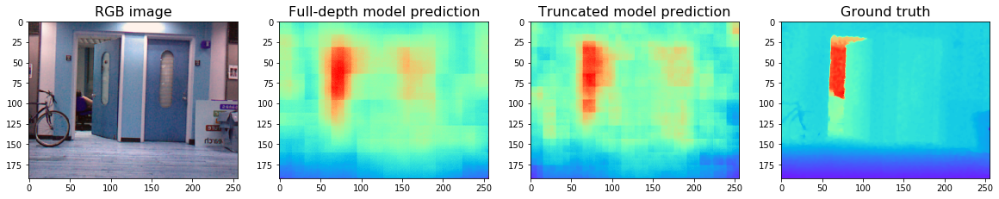

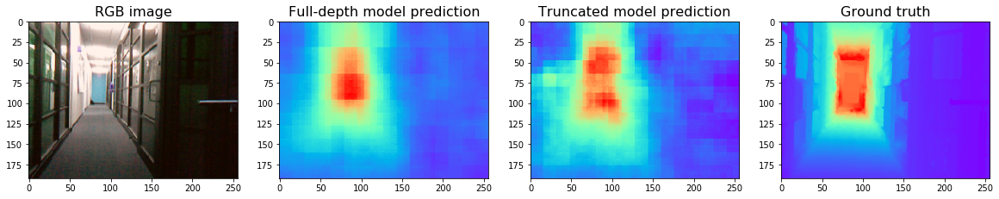

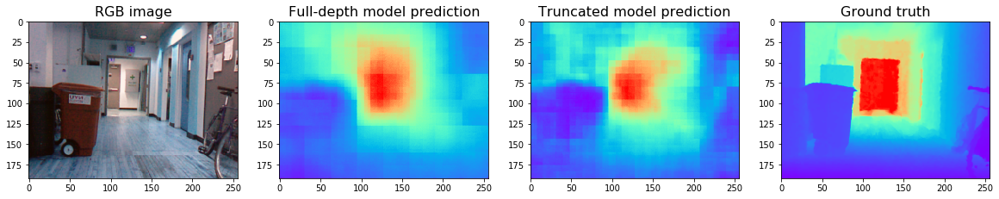

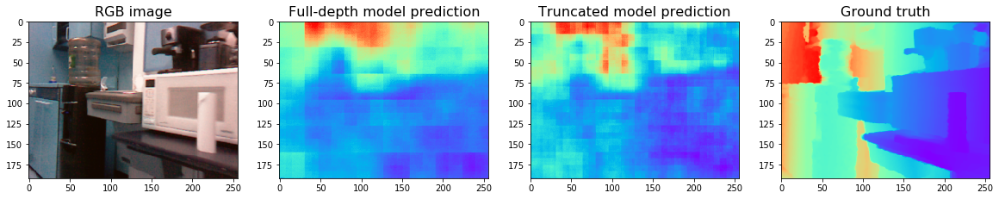

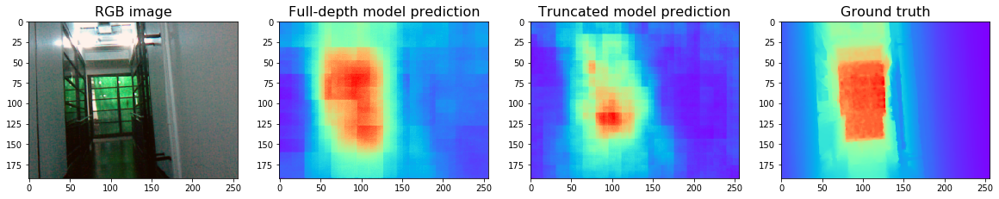

...

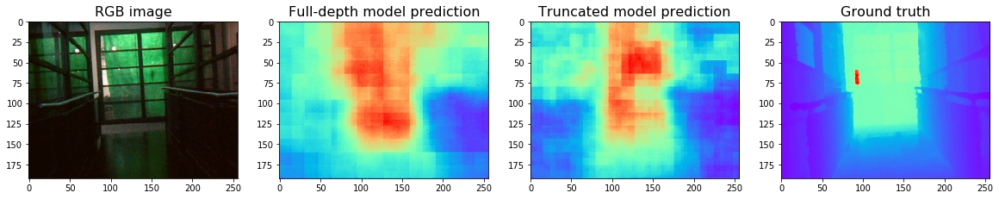

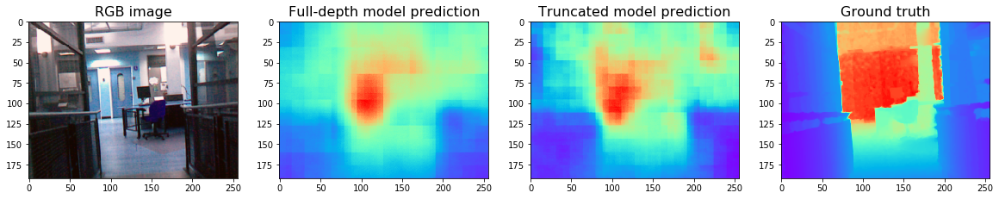

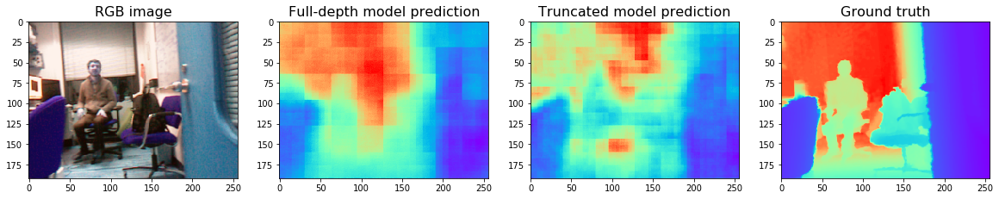

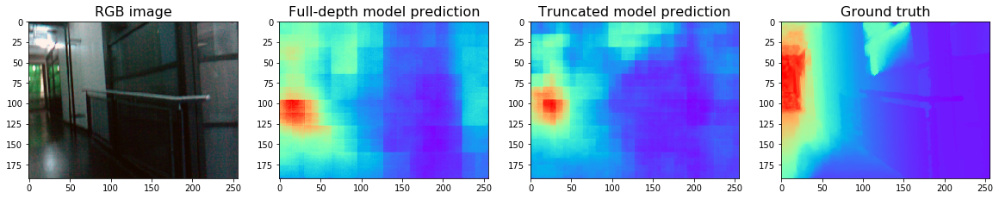

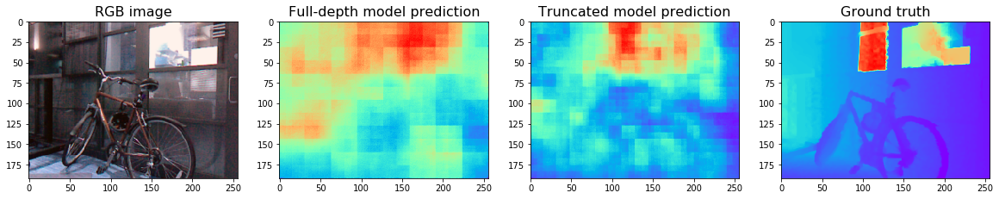

In [19]:
for rgb_image, depth_image in zip(rgbs_sample_for_watch, depths_sample_for_watch):
    plt.figure(figsize=(20, 5))
    plt.subplot(1, 4, 1)
    plt.title('RGB image', fontsize=16)
    plt.imshow(unpreprocess(rgb_image))
    plt.subplot(1, 4, 2)
    plt.title('Full-depth model prediction', fontsize=16)
    model_5blocks_prediction = model_5blocks.predict(rgb_image[np.newaxis, ...])
    plt.imshow(model_5blocks_prediction[0] / 10, cmap='rainbow')
    plt.subplot(1, 4, 3)
    plt.title('Truncated model prediction', fontsize=16)
    model_4blocks_prediction = model_4blocks.predict(rgb_image[np.newaxis, ...])
    plt.imshow(unpreprocess(model_4blocks_prediction[0]) / 10, cmap='rainbow')
    plt.subplot(1, 4, 4)
    plt.title('Ground truth', fontsize=16)
    plt.imshow(depth_image / 10, cmap='rainbow')

### Визуализация изображений на неизвестных сценах

In [27]:
rgbs_scene_sample_for_watch = rgbs_scene_downscaled[134::235]
depths_scene_sample_for_watch = depths_scene_downscaled[134::235]

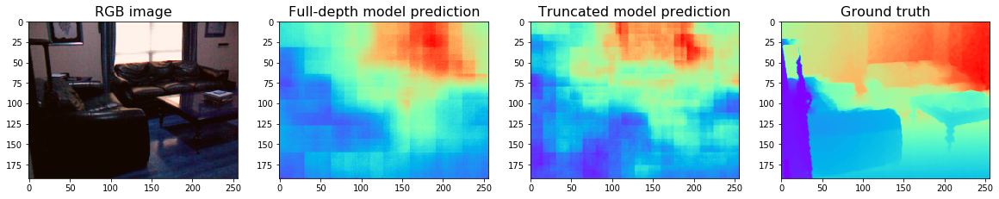

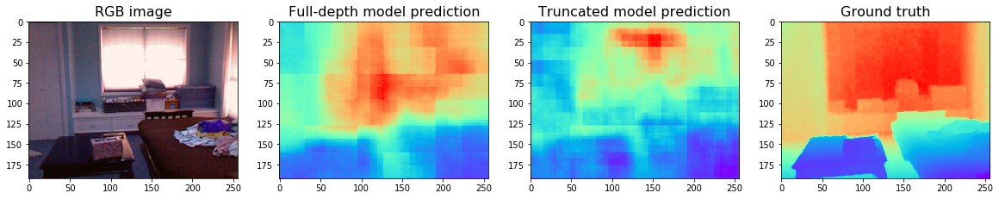

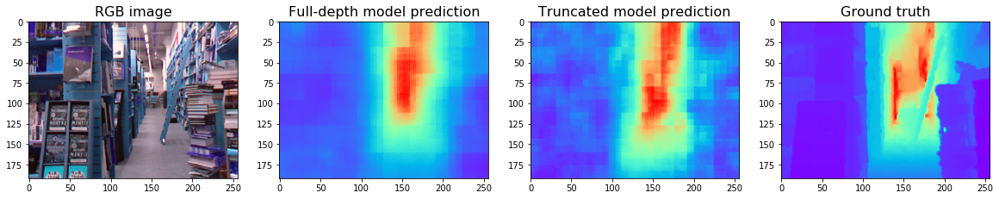

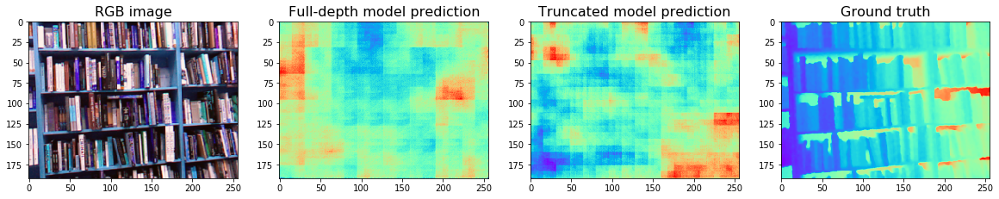

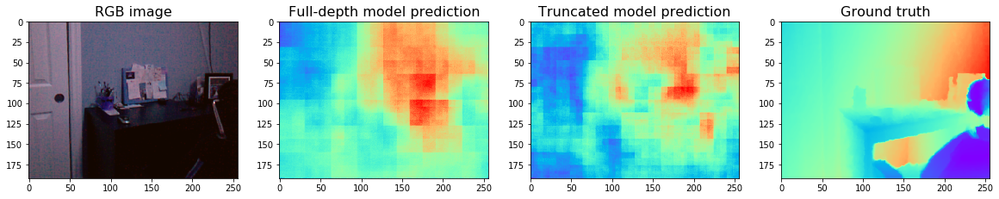

...

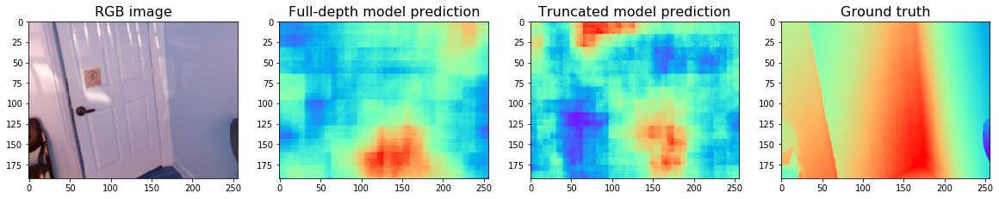

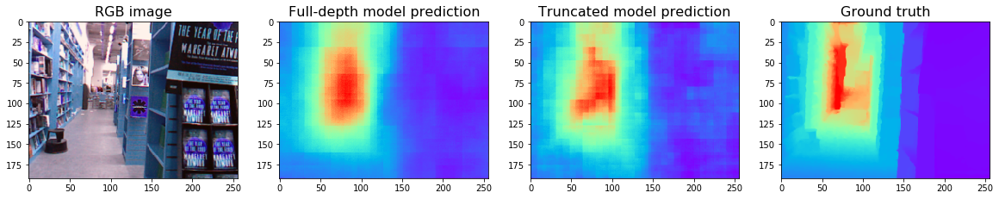

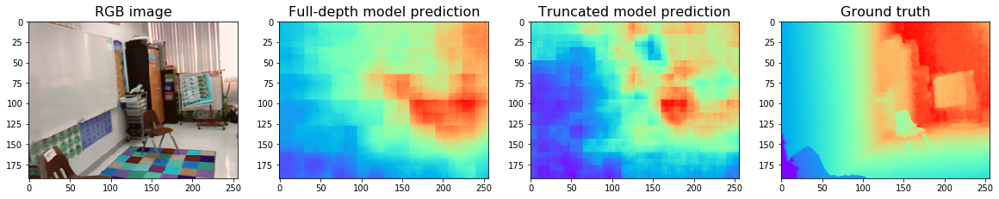

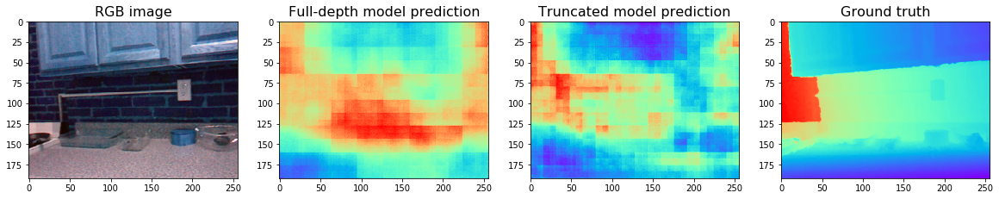

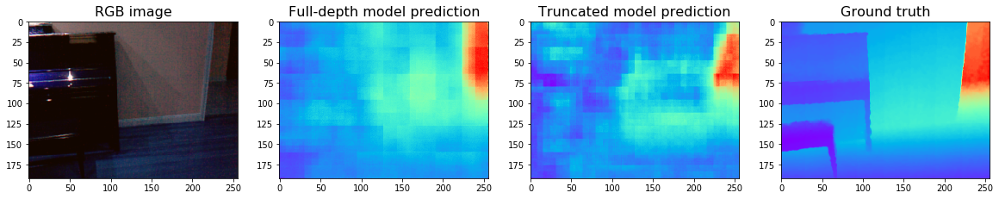

In [28]:
for rgb_image, depth_image in zip(rgbs_scene_sample_for_watch, depths_scene_sample_for_watch):
    plt.figure(figsize=(20, 5))
    plt.subplot(1, 4, 1)
    plt.title('RGB image', fontsize=16)
    plt.imshow(unpreprocess(rgb_image))
    plt.subplot(1, 4, 2)
    plt.title('Full-depth model prediction', fontsize=16)
    model_5blocks_prediction = model_5blocks.predict(rgb_image[np.newaxis, ...])
    plt.imshow(model_5blocks_prediction[0] / 10, cmap='rainbow')
    plt.subplot(1, 4, 3)
    plt.title('Truncated model prediction', fontsize=16)
    model_4blocks_prediction = model_4blocks.predict(rgb_image[np.newaxis, ...])
    plt.imshow(unpreprocess(model_4blocks_prediction[0]) / 10, cmap='rainbow')
    plt.subplot(1, 4, 4)
    plt.title('Ground truth', fontsize=16)
    plt.imshow(depth_image / 10, cmap='rainbow')